In [1]:
# import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import squarify
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.express as px


In [2]:
pip install squarify

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install folium


Note: you may need to restart the kernel to use updated packages.


In [4]:
# load the dataset
df = pd.read_csv(r"C:\Users\agico\Downloads\archive (22)\food_hygiene_rating_data.csv")


In [5]:
df

,Unnamed: 0,FHRSID,LocalAuthorityBusinessID,BusinessName,BusinessType,PostCode,RatingValue,RatingKey,RatingDate,LocalAuthorityCode,LocalAuthorityName,Longitude,Latitude
0,0,1438654,21/00856/FOOD,1st Base Catering,Mobile caterer,E20 2ST,AwaitingInspection,fhrs_awaitinginspection_en-GB,NaN,525,Newham,-0.018066,51.538799
1,1,1132140,19/00459/FOOD,53.5 Degrees,Restaurant/Cafe/Canteen,E16 2RD,5,fhrs_5_en-GB,2019-05-10,525,Newham,0.064757,51.507405
2,2,1132134,19/00447/FOOD,53.5 Degrees,Restaurant/Cafe/Canteen,E15 4LZ,5,fhrs_5_en-GB,2019-05-14,525,Newham,0.009809,51.543395
3,3,1260384,20/00288/FOOD,55 Square Limited,Restaurant/Cafe/Canteen,E16 1EN,2,fhrs_2_en-GB,2020-12-09,525,Newham,0.012417,51.517514
4,4,1389145,21/00354/FOOD,7 Mamas Ltd,Takeaway/sandwich shop,E6 3HN,5,fhrs_5_en-GB,2022-01-05,525,Newham,0.055372,51.527803
...,...,...,...,...,...,...,...,...,...,...,...,...,...
24347,1074,1030095,70963,Sure Deal African Restaurant,Restaurant/Cafe/Canteen,RM8 3UU,5,fhrs_5_en-GB,2020-02-29,501,Barking and Dagenham,0.071267,51.540357
24348,1075,1432572,78113,Sushi and Bento House / Ban Thai/ Fusion House,Restaurant/Cafe/Canteen,RM8 3NH,5,fhrs_5_en-GB,2022-01-23,501,Barking and Dagenham,0.078451,51.537946
24349,1076,1079143,71743,Suvai Foods UK LTD,Retailers - other,RM9 5SL,3,fhrs_3_en-GB,2021-11-18,501,Barking and Dagenham,0.141192,51.571934
24350,1077,1292182,76637,Suyahut,Takeaway/sandwich shop,IG11 8ED,5,fhrs_5_en-GB,2020-10-22,501,Barking and Dagenham,0.129532,51.551553


In [6]:
df.head()

,Unnamed: 0,FHRSID,LocalAuthorityBusinessID,BusinessName,BusinessType,PostCode,RatingValue,RatingKey,RatingDate,LocalAuthorityCode,LocalAuthorityName,Longitude,Latitude
0,0,1438654,21/00856/FOOD,1st Base Catering,Mobile caterer,E20 2ST,AwaitingInspection,fhrs_awaitinginspection_en-GB,NaN,525,Newham,-0.018066,51.538799
1,1,1132140,19/00459/FOOD,53.5 Degrees,Restaurant/Cafe/Canteen,E16 2RD,5,fhrs_5_en-GB,2019-05-10,525,Newham,0.064757,51.507405
2,2,1132134,19/00447/FOOD,53.5 Degrees,Restaurant/Cafe/Canteen,E15 4LZ,5,fhrs_5_en-GB,2019-05-14,525,Newham,0.009809,51.543395
3,3,1260384,20/00288/FOOD,55 Square Limited,Restaurant/Cafe/Canteen,E16 1EN,2,fhrs_2_en-GB,2020-12-09,525,Newham,0.012417,51.517514
4,4,1389145,21/00354/FOOD,7 Mamas Ltd,Takeaway/sandwich shop,E6 3HN,5,fhrs_5_en-GB,2022-01-05,525,Newham,0.055372,51.527803


In [7]:
df.tail()

,Unnamed: 0,FHRSID,LocalAuthorityBusinessID,BusinessName,BusinessType,PostCode,RatingValue,RatingKey,RatingDate,LocalAuthorityCode,LocalAuthorityName,Longitude,Latitude
24347,1074,1030095,70963,Sure Deal African Restaurant,Restaurant/Cafe/Canteen,RM8 3UU,5,fhrs_5_en-GB,2020-02-29,501,Barking and Dagenham,0.071267,51.540357
24348,1075,1432572,78113,Sushi and Bento House / Ban Thai/ Fusion House,Restaurant/Cafe/Canteen,RM8 3NH,5,fhrs_5_en-GB,2022-01-23,501,Barking and Dagenham,0.078451,51.537946
24349,1076,1079143,71743,Suvai Foods UK LTD,Retailers - other,RM9 5SL,3,fhrs_3_en-GB,2021-11-18,501,Barking and Dagenham,0.141192,51.571934
24350,1077,1292182,76637,Suyahut,Takeaway/sandwich shop,IG11 8ED,5,fhrs_5_en-GB,2020-10-22,501,Barking and Dagenham,0.129532,51.551553
24351,1078,798417,67163,Sweet Heaven,Retailers - other,RM9 4AL,5,fhrs_5_en-GB,2015-08-26,501,Barking and Dagenham,0.077494,51.536263


In [8]:
df.columns

Index(['Unnamed: 0', 'FHRSID', 'LocalAuthorityBusinessID', 'BusinessName',
       'BusinessType', 'PostCode', 'RatingValue', 'RatingKey', 'RatingDate',
       'LocalAuthorityCode', 'LocalAuthorityName', 'Longitude', 'Latitude'],
      dtype='object')

In [9]:
df.describe()

,Unnamed: 0,FHRSID,LocalAuthorityCode,Longitude,Latitude
count,24352.000000,2.435200e+04,24352.000000,24352.000000,24352.000000
mean,940.406127,9.078713e+05,516.565662,-0.101340,51.528516
std,758.940910,3.808622e+05,9.214929,0.146662,0.052086
min,0.000000,5.930000e+02,501.000000,-3.422592,50.695622
25%,288.000000,5.152438e+05,509.000000,-0.140140,51.503144
50%,785.000000,1.000268e+06,514.000000,-0.088583,51.534371
75%,1394.000000,1.263384e+06,526.000000,-0.013117,51.559136
max,3168.000000,1.486251e+06,533.000000,0.524309,53.741785


In [10]:
df['RatingValue'].value_counts()


5                      12544
4                       4483
3                       2450
AwaitingInspection      2439
Exempt                  1070
2                        675
1                        550
0                        140
AwaitingPublication        1
Name: RatingValue, dtype: int64

In [11]:
df['BusinessType'].value_counts()


Restaurant/Cafe/Canteen                  7307
Retailers - other                        5553
Takeaway/sandwich shop                   3102
Other catering premises                  2917
Hospitals/Childcare/Caring Premises      1338
School/college/university                1101
Pub/bar/nightclub                        1040
Mobile caterer                            608
Retailers - supermarkets/hypermarkets     536
Manufacturers/packers                     373
Hotel/bed & breakfast/guest house         308
Distributors/Transporters                 110
Importers/Exporters                        51
Farmers/growers                             8
Name: BusinessType, dtype: int64

In [12]:
# group the data by rating value and count the number of businesses for each rating value
business_count = df.groupby('RatingValue')['BusinessType'].count().reset_index(name='BusinessCount')


<AxesSubplot:xlabel='BusinessCount', ylabel='RatingValue'>

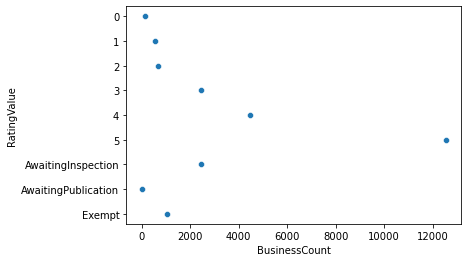

In [13]:
# create a scatter plot
sns.scatterplot(data=business_count, x='BusinessCount', y='RatingValue')

In [14]:
newFrame = df.groupby(['BusinessType'])['RatingValue'].value_counts().unstack(1)
title = 'Stacked Bar Plot showing the different distributions of types of shops relating to hygiene ratings in the UK '


<AxesSubplot:title={'center':'Stacked Bar Plot showing the different distributions of types of shops relating to hygiene ratings in the UK '}, xlabel='BusinessType'>

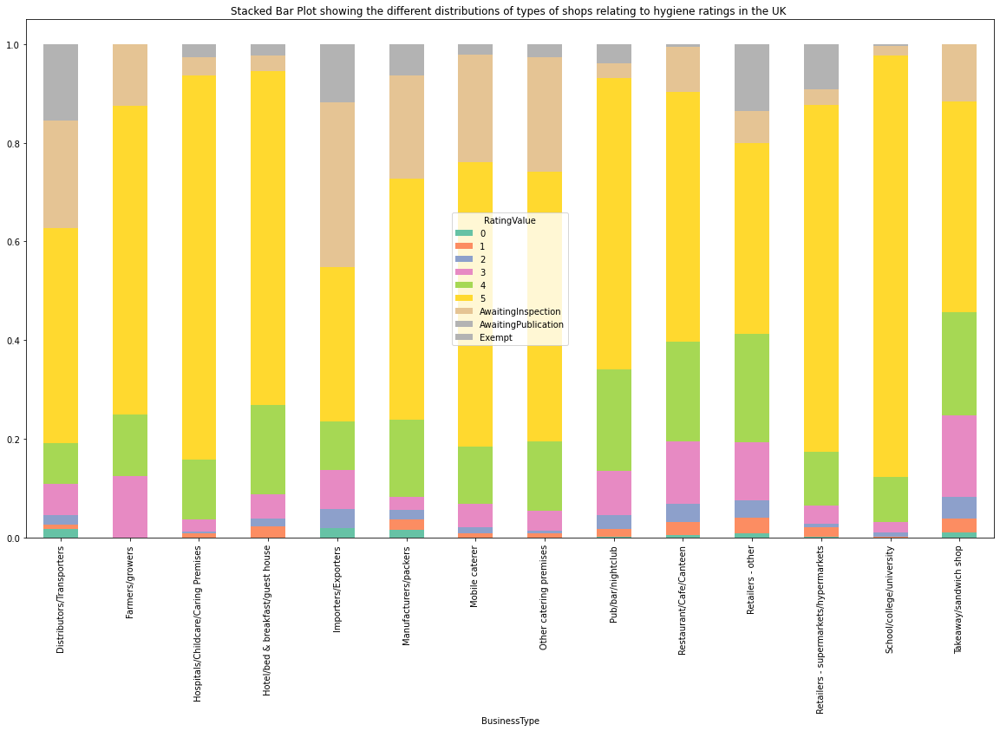

In [15]:
newFrame.div(newFrame.sum(axis=1), axis=0).plot.bar(stacked=True,  colormap ='Set2', title=title,figsize=(20,11))


In [16]:
corr_matrix = df.corr()


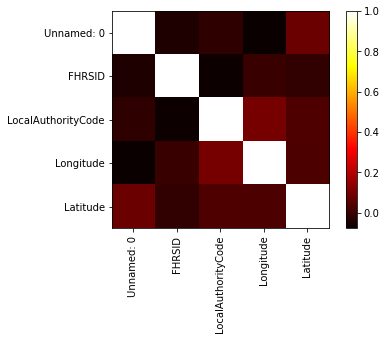

In [17]:
plt.imshow(corr_matrix, cmap='hot', interpolation='nearest')
plt.xticks(range(len(corr_matrix)), corr_matrix.columns, rotation=90)
plt.yticks(range(len(corr_matrix)), corr_matrix.columns)
plt.colorbar()
plt.show()

<AxesSubplot:title={'center':'Tree map displaying the size of the different Rating values of stores'}>

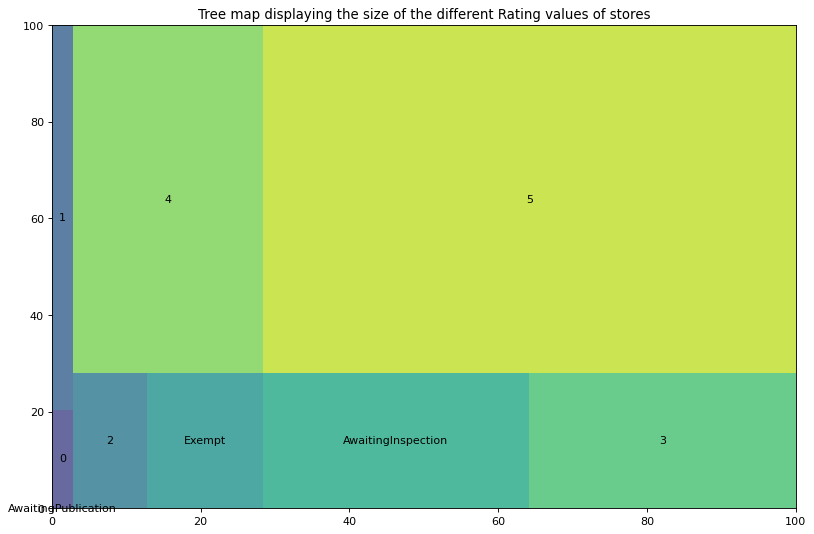

In [18]:
# labels = ['5','4', '3','AwaitingInspection','Exempt','2','1', '0','AP']

plt.figure(figsize=(12,8), dpi= 80)
plt.title('Tree map displaying the size of the different Rating values of stores')
squarify.plot(sizes=df['RatingValue'].value_counts().sort_values(),
              label=df['RatingValue'].value_counts().sort_values().index,
              color = sns.color_palette('viridis',len(df['RatingValue'].value_counts().sort_values().index)),
              alpha=.8)

In [19]:
# Defining required colums for map visualisation 
df_map = df[['RatingValue', 'BusinessName', 'Latitude', 'Longitude', 'PostCode', 'BusinessType', 'LocalAuthorityName']]


In [20]:
df_map

,RatingValue,BusinessName,Latitude,Longitude,PostCode,BusinessType,LocalAuthorityName
0,AwaitingInspection,1st Base Catering,51.538799,-0.018066,E20 2ST,Mobile caterer,Newham
1,5,53.5 Degrees,51.507405,0.064757,E16 2RD,Restaurant/Cafe/Canteen,Newham
2,5,53.5 Degrees,51.543395,0.009809,E15 4LZ,Restaurant/Cafe/Canteen,Newham
3,2,55 Square Limited,51.517514,0.012417,E16 1EN,Restaurant/Cafe/Canteen,Newham
4,5,7 Mamas Ltd,51.527803,0.055372,E6 3HN,Takeaway/sandwich shop,Newham
...,...,...,...,...,...,...,...
24347,5,Sure Deal African Restaurant,51.540357,0.071267,RM8 3UU,Restaurant/Cafe/Canteen,Barking and Dagenham
24348,5,Sushi and Bento House / Ban Thai/ Fusion House,51.537946,0.078451,RM8 3NH,Restaurant/Cafe/Canteen,Barking and Dagenham
24349,3,Suvai Foods UK LTD,51.571934,0.141192,RM9 5SL,Retailers - other,Barking and Dagenham
24350,5,Suyahut,51.551553,0.129532,IG11 8ED,Takeaway/sandwich shop,Barking and Dagenham


In [21]:
fig = px.scatter_mapbox(df_map, hover_data=["RatingValue", 'LocalAuthorityName',"PostCode"],hover_name="BusinessName",color="RatingValue",lat="Latitude", lon="Longitude",
                         color_continuous_scale=px.colors.sequential.Bluered, 
                        height=700,size_max=15, zoom=10,animation_frame="RatingValue")
fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.update_layout(transition = {'duration': 2000})
fig.show()

In [22]:
fig = px.density_mapbox(df_map, lat='Latitude', lon='Longitude', z='RatingValue', radius=10,
                        center=dict(lat=51.5074, lon=0.1278), zoom=9,
                        mapbox_style='carto-positron', opacity=0.7, 
                        color_continuous_scale='bluered', range_color=[0, 5])

fig.show()

In [23]:
# clean and preprocess the data
df = df.drop(columns=['Unnamed: 0', 'LocalAuthorityBusinessID', 'BusinessName', 'RatingKey'])
df = df.dropna()
df['BusinessType'] = df['BusinessType'].str.replace('&', 'and')  # clean up the BusinessType column


In [24]:
# create a list of values to remove
to_remove = ['Exempt', 'AwaitingInspection', 'AwaitingPublication']

# use boolean indexing to select only the rows that don't match the values to remove
df = df[~df['RatingValue'].isin(to_remove)]


In [25]:
df

,FHRSID,BusinessType,PostCode,RatingValue,RatingDate,LocalAuthorityCode,LocalAuthorityName,Longitude,Latitude
1,1132140,Restaurant/Cafe/Canteen,E16 2RD,5,2019-05-10,525,Newham,0.064757,51.507405
2,1132134,Restaurant/Cafe/Canteen,E15 4LZ,5,2019-05-14,525,Newham,0.009809,51.543395
3,1260384,Restaurant/Cafe/Canteen,E16 1EN,2,2020-12-09,525,Newham,0.012417,51.517514
4,1389145,Takeaway/sandwich shop,E6 3HN,5,2022-01-05,525,Newham,0.055372,51.527803
5,680560,Retailers - other,E7 9BY,4,2019-09-13,525,Newham,0.017781,51.550156
...,...,...,...,...,...,...,...,...,...
24347,1030095,Restaurant/Cafe/Canteen,RM8 3UU,5,2020-02-29,501,Barking and Dagenham,0.071267,51.540357
24348,1432572,Restaurant/Cafe/Canteen,RM8 3NH,5,2022-01-23,501,Barking and Dagenham,0.078451,51.537946
24349,1079143,Retailers - other,RM9 5SL,3,2021-11-18,501,Barking and Dagenham,0.141192,51.571934
24350,1292182,Takeaway/sandwich shop,IG11 8ED,5,2020-10-22,501,Barking and Dagenham,0.129532,51.551553


In [26]:
# encode categorical variables
le = LabelEncoder()
df['BusinessType'] = le.fit_transform(df['BusinessType'])
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
df['PostCode'] = encoder.fit_transform(df['PostCode'])

In [27]:
df

,FHRSID,BusinessType,PostCode,RatingValue,RatingDate,LocalAuthorityCode,LocalAuthorityName,Longitude,Latitude
1,1132140,9,967,5,2019-05-10,525,Newham,0.064757,51.507405
2,1132134,9,919,5,2019-05-14,525,Newham,0.009809,51.543395
3,1260384,9,934,2,2020-12-09,525,Newham,0.012417,51.517514
4,1389145,13,1608,5,2022-01-05,525,Newham,0.055372,51.527803
5,680560,10,1690,4,2019-09-13,525,Newham,0.017781,51.550156
...,...,...,...,...,...,...,...,...,...
24347,1030095,9,5824,5,2020-02-29,501,Barking and Dagenham,0.071267,51.540357
24348,1432572,9,5817,5,2022-01-23,501,Barking and Dagenham,0.078451,51.537946
24349,1079143,10,5858,3,2021-11-18,501,Barking and Dagenham,0.141192,51.571934
24350,1292182,13,2902,5,2020-10-22,501,Barking and Dagenham,0.129532,51.551553


In [28]:
# Feature engineering
df['RatingDate'] = pd.to_datetime(df['RatingDate'])
df['Year'] = df['RatingDate'].dt.year
df

,FHRSID,BusinessType,PostCode,RatingValue,RatingDate,LocalAuthorityCode,LocalAuthorityName,Longitude,Latitude,Year
1,1132140,9,967,5,2019-05-10,525,Newham,0.064757,51.507405,2019
2,1132134,9,919,5,2019-05-14,525,Newham,0.009809,51.543395,2019
3,1260384,9,934,2,2020-12-09,525,Newham,0.012417,51.517514,2020
4,1389145,13,1608,5,2022-01-05,525,Newham,0.055372,51.527803,2022
5,680560,10,1690,4,2019-09-13,525,Newham,0.017781,51.550156,2019
...,...,...,...,...,...,...,...,...,...,...
24347,1030095,9,5824,5,2020-02-29,501,Barking and Dagenham,0.071267,51.540357,2020
24348,1432572,9,5817,5,2022-01-23,501,Barking and Dagenham,0.078451,51.537946,2022
24349,1079143,10,5858,3,2021-11-18,501,Barking and Dagenham,0.141192,51.571934,2021
24350,1292182,13,2902,5,2020-10-22,501,Barking and Dagenham,0.129532,51.551553,2020


In [29]:
# Coverting postcodes to number code
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
df['PostCode'] = encoder.fit_transform(df['PostCode'])
df

,FHRSID,BusinessType,PostCode,RatingValue,RatingDate,LocalAuthorityCode,LocalAuthorityName,Longitude,Latitude,Year
1,1132140,9,967,5,2019-05-10,525,Newham,0.064757,51.507405,2019
2,1132134,9,919,5,2019-05-14,525,Newham,0.009809,51.543395,2019
3,1260384,9,934,2,2020-12-09,525,Newham,0.012417,51.517514,2020
4,1389145,13,1608,5,2022-01-05,525,Newham,0.055372,51.527803,2022
5,680560,10,1690,4,2019-09-13,525,Newham,0.017781,51.550156,2019
...,...,...,...,...,...,...,...,...,...,...
24347,1030095,9,5824,5,2020-02-29,501,Barking and Dagenham,0.071267,51.540357,2020
24348,1432572,9,5817,5,2022-01-23,501,Barking and Dagenham,0.078451,51.537946,2022
24349,1079143,10,5858,3,2021-11-18,501,Barking and Dagenham,0.141192,51.571934,2021
24350,1292182,13,2902,5,2020-10-22,501,Barking and Dagenham,0.129532,51.551553,2020


In [30]:
le = LabelEncoder()


In [31]:
df['LocalAuthorityCode'] = le.fit_transform(df['LocalAuthorityName'])


In [32]:
# print the unique numerical codes and corresponding LocalAuthorityName values
print(df[['LocalAuthorityCode', 'LocalAuthorityName']].drop_duplicates().sort_values('LocalAuthorityCode'))

       LocalAuthorityCode          LocalAuthorityName
23273                   0        Barking and Dagenham
11577                   1                      Bexley
11940                   2                       Brent
12227                   3                     Bromley
12429                   4                      Camden
4893                    5  City of London Corporation
15598                   6                     Croydon
15782                   7                      Ealing
17225                   8                     Enfield
821                     9                   Greenwich
17299                  10                     Hackney
19951                  11      Hammersmith and Fulham
20223                  12                    Haringey
21411                  13                  Hillingdon
2439                   14                   Islington
4364                   15        Kingston-Upon-Thames
4400                   16                     Lambeth
4596                   17   

In [33]:
# Drop the LocalAuthorityName column
df = df.drop('LocalAuthorityName', axis=1)

In [34]:
df

,FHRSID,BusinessType,PostCode,RatingValue,RatingDate,LocalAuthorityCode,Longitude,Latitude,Year
1,1132140,9,967,5,2019-05-10,19,0.064757,51.507405,2019
2,1132134,9,919,5,2019-05-14,19,0.009809,51.543395,2019
3,1260384,9,934,2,2020-12-09,19,0.012417,51.517514,2020
4,1389145,13,1608,5,2022-01-05,19,0.055372,51.527803,2022
5,680560,10,1690,4,2019-09-13,19,0.017781,51.550156,2019
...,...,...,...,...,...,...,...,...,...
24347,1030095,9,5824,5,2020-02-29,0,0.071267,51.540357,2020
24348,1432572,9,5817,5,2022-01-23,0,0.078451,51.537946,2022
24349,1079143,10,5858,3,2021-11-18,0,0.141192,51.571934,2021
24350,1292182,13,2902,5,2020-10-22,0,0.129532,51.551553,2020


In [35]:
df['RatingValue'] = pd.to_numeric(df['RatingValue'], errors='coerce')


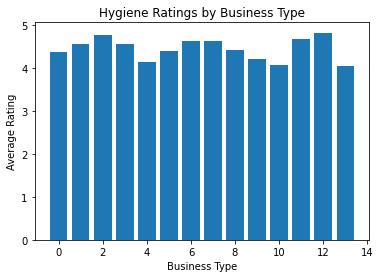

In [36]:
import matplotlib.pyplot as plt

# Create a bar chart of the average hygiene ratings for each Business type
ratings_by_cuisine = df.groupby('BusinessType')['RatingValue'].mean()
plt.bar(ratings_by_cuisine.index, ratings_by_cuisine.values)
plt.xlabel('Business Type')
plt.ylabel('Average Rating')
plt.title('Hygiene Ratings by Business Type')
plt.show()

In [37]:
# Save the updated DataFrame to a new file
df.to_csv('updated_file.csv', index=False)


In [38]:
df['RatingDate'] = pd.to_datetime(df['RatingDate'])


In [39]:
df.drop('RatingDate', axis=1, inplace=True)


In [40]:
# split the data into training and testing sets
X = df.drop(columns=['RatingValue'])
y = df['RatingValue']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [41]:
X_train

,FHRSID,BusinessType,PostCode,LocalAuthorityCode,Longitude,Latitude,Year
9350,1171495,10,5908,21,-0.081590,51.500646,2019
15458,1105496,11,4212,4,-0.121705,51.520694,2019
16851,1250391,7,8750,7,-0.285128,51.537196,2020
11494,514216,8,883,24,-0.006488,51.581973,2021
10628,1211925,10,1366,24,-0.019146,51.575029,2021
...,...,...,...,...,...,...,...
12779,688191,10,1963,4,-0.118417,51.522125,2018
13558,425669,9,4986,4,-0.176596,51.545219,2017
6316,1266201,7,2684,20,0.100884,51.608490,2020
975,905033,6,7774,9,0.027859,51.479328,2020


In [42]:
y_train

9350     4
15458    5
16851    5
11494    5
10628    0
        ..
12779    5
13558    5
6316     4
975      5
18353    5
Name: RatingValue, Length: 16673, dtype: int64

In [43]:
X_test

,FHRSID,BusinessType,PostCode,LocalAuthorityCode,Longitude,Latitude,Year
539,897406,12,1694,19,0.011217,51.516385,2019
4333,457783,8,3468,14,-0.114326,51.570068,2019
22495,962744,2,8586,13,-0.409785,51.601513,2017
22547,558944,10,2478,13,-0.409838,51.601385,2021
4921,1374210,0,2279,5,-0.081234,51.517358,2021
...,...,...,...,...,...,...,...
13840,424271,11,4916,4,-0.140884,51.551988,2017
2819,1067110,12,2057,14,-0.114474,51.543232,2021
19696,925281,9,1858,10,-0.054472,51.549498,2019
7578,1153213,13,6206,21,-0.073272,51.470367,2019


In [44]:
y_test

539      5
4333     5
22495    5
22547    1
4921     5
        ..
13840    5
2819     5
19696    5
7578     4
10916    1
Name: RatingValue, Length: 4169, dtype: int64

In [45]:
df['LocalAuthorityCode'].value_counts()


4     2749
21    2738
10    1952
13    1675
24    1623
14    1511
20    1338
9     1158
7     1075
12    1031
0      902
19     720
1      320
26     294
2      272
11     257
18     251
17     237
16     168
6      155
3      143
22      94
5       68
8       59
15      26
25      23
23       3
Name: LocalAuthorityCode, dtype: int64

In [46]:
# scale the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [47]:
# train the model
model = LogisticRegression()
model.fit(X_train, y_train)

LogisticRegression()

In [48]:
# evaluate the model
y_pred = model.predict(X_test)
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Confusion Matrix:\n', confusion_matrix(y_test, y_pred))
print('Classification Report:\n', classification_report(y_test, y_pred))

Accuracy: 0.5845526505157111
Confusion Matrix:
 [[   0    0    0    0    0   27]
 [   0    0    0    0    0  102]
 [   0    0    0    0    0  138]
 [   0    0    0    0    0  505]
 [   0    0    0    0    0  958]
 [   2    0    0    0    0 2437]]
Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        27
           1       0.00      0.00      0.00       102
           2       0.00      0.00      0.00       138
           3       0.00      0.00      0.00       505
           4       0.00      0.00      0.00       958
           5       0.58      1.00      0.74      2439

    accuracy                           0.58      4169
   macro avg       0.10      0.17      0.12      4169
weighted avg       0.34      0.58      0.43      4169



C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

